In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
# import os
# import shutil


# # Исходные папки
# base_path = '/kaggle/input/drone-uav-bird/total_dataset'
# splits = ['train', 'valid', 'test']

# # Папки для сохранения
# output_images = '/kaggle/working/clean_dataset/images'
# output_labels = '/kaggle/working/clean_dataset/labels'

# # Создаем выходные папки
# os.makedirs(output_images, exist_ok=True)
# os.makedirs(output_labels, exist_ok=True)

# # Считаем общее количество файлов
# total_files = sum(len(os.listdir(os.path.join(base_path, split, 'labels'))) for split in splits)
# processed = 0

# for split in splits:
#     label_dir = os.path.join(base_path, split, 'labels')
#     image_dir = os.path.join(base_path, split, 'images')
    
#     for file in os.listdir(label_dir):
#         if file.endswith('.txt'):
#             processed += 1
#             txt_path = os.path.join(label_dir, file)
            
#             # Читаем строки
#             with open(txt_path, 'r') as f:
#                 lines = f.readlines()
            
#             # Фильтруем только строки с классом 1
#             drone_lines = []
#             for line in lines:
#                 parts = line.strip().split()
#                 if parts[0] == '1':
#                     parts[0] = '0'  # заменяем class 1 -> class 0
#                     drone_lines.append(' '.join(parts))
            
#             # Если есть дрон в файле
#             if drone_lines:
#                 # Сохраняем новый .txt
#                 out_txt_path = os.path.join(output_labels, file)
#                 with open(out_txt_path, 'w') as f:
#                     f.write('\n'.join(drone_lines))
                
#                 # Копируем соответствующее изображение
#                 img_file = file.replace('.txt', '.jpg')
#                 src_img_path = os.path.join(image_dir, img_file)
#                 dst_img_path = os.path.join(output_images, img_file)
                
#                 if os.path.exists(src_img_path):
#                     shutil.copy(src_img_path, dst_img_path)
#                 else:
#                     print(f" Картинка {img_file} не найдена для {file}")
            



In [3]:

# source_path = '/kaggle/input/aircraft-type-uavs/aircraft-type UAVs'

# # Список файлов
# files = os.listdir(source_path)

# for file in files:
#     src_file = os.path.join(source_path, file)
#     if file.endswith('.jpg'):
#         dst_file = os.path.join(output_images, file)
#         shutil.copy(src_file, dst_file)
#     elif file.endswith('.txt'):
#         dst_file = os.path.join(output_labels, file)
        
#         # Опционально: проверим, что class=0
#         with open(src_file, 'r') as f:
#             lines = f.readlines()
        
#         fixed_lines = []
#         for line in lines:
#             parts = line.strip().split()
#             if parts[0] != '0':
#                 print(f" найден class != 0 в {file}: {line.strip()}")
#             fixed_lines.append(line.strip())  # (оставляем как есть)
        
#         # Сохраняем
#         with open(dst_file, 'w') as f:
#             f.write('\n'.join(fixed_lines))


In [4]:


# # Исходная папка
# source_path = '/kaggle/input/drone-dataset-uav/drone_dataset_yolo/dataset_txt'

# # Создаем выходные папки, если не созданы
# os.makedirs(output_images, exist_ok=True)
# os.makedirs(output_labels, exist_ok=True)

# # Проходим по всем файлам
# for file in os.listdir(source_path):
#     src_file = os.path.join(source_path, file)
    
#     if file.endswith('.jpg'):
#         dst_file = os.path.join(output_images, file)
#         shutil.copy(src_file, dst_file)
    
#     elif file.endswith('.txt'):
#         dst_file = os.path.join(output_labels, file)
#         shutil.copy(src_file, dst_file)


In [5]:
# !zip -r /kaggle/working/clean_dataset.zip /kaggle/working/clean_dataset


In [6]:
!pip install ultralytics

In [7]:
import os
os.makedirs('/kaggle/working/clean_dataset', exist_ok=True)


yaml_path = '/kaggle/working/clean_dataset/data.yaml'

# Содержимое yaml
yaml_content = """
train: /kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset/images
val: /kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset/images

nc: 1
names: ['drone']
"""

# Запись в файл
with open(yaml_path, 'w') as f:
    f.write(yaml_content.strip())

print('✅ YAML создан')


✅ YAML создан


In [8]:
from ultralytics import YOLO

# Загружаем модель small
model = YOLO('yolov8s.pt')

# Обучаем
model.train(data='/kaggle/working/clean_dataset/data.yaml', epochs=5, imgsz=640)


Ultralytics 8.3.127 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/clean_dataset/data.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.

KeyboardInterrupt: 

In [ ]:
# Загружаем последнюю сохранённую модель
model = YOLO('/kaggle/working/runs/detect/train/weights/last.pt')

# Продолжаем обучение
model.train(epochs=5)


image 1/23 /kaggle/input/my-drone-test-v-trash/293185-alexfas01.jpg: 384x640 (no detections), 11.7ms
image 2/23 /kaggle/input/my-drone-test-v-trash/44ed1041673116d5ab7f721a97a79c7b.jpg: 480x640 (no detections), 14.1ms
image 3/23 /kaggle/input/my-drone-test-v-trash/UAVS_10.jpg: 480x640 1 drone, 13.1ms
image 4/23 /kaggle/input/my-drone-test-v-trash/UAVS_11.jpg: 320x640 1 drone, 11.2ms
image 5/23 /kaggle/input/my-drone-test-v-trash/UAVS_12.jpg: 448x640 1 drone, 13.8ms
image 6/23 /kaggle/input/my-drone-test-v-trash/UAVS_13.jpg: 352x640 1 drone, 11.5ms
image 7/23 /kaggle/input/my-drone-test-v-trash/UAVS_2.jpg: 224x640 1 drone, 9.2ms
image 8/23 /kaggle/input/my-drone-test-v-trash/UAVS_228.jpg: 640x640 (no detections), 17.1ms
image 9/23 /kaggle/input/my-drone-test-v-trash/UAVS_229.jpg: 576x640 1 drone, 16.6ms
image 10/23 /kaggle/input/my-drone-test-v-trash/UAVS_230.jpg: 352x640 1 drone, 11.3ms
image 11/23 /kaggle/input/my-drone-test-v-trash/UAVS_231.jpg: 160x640 (no detections), 8.9ms
image 

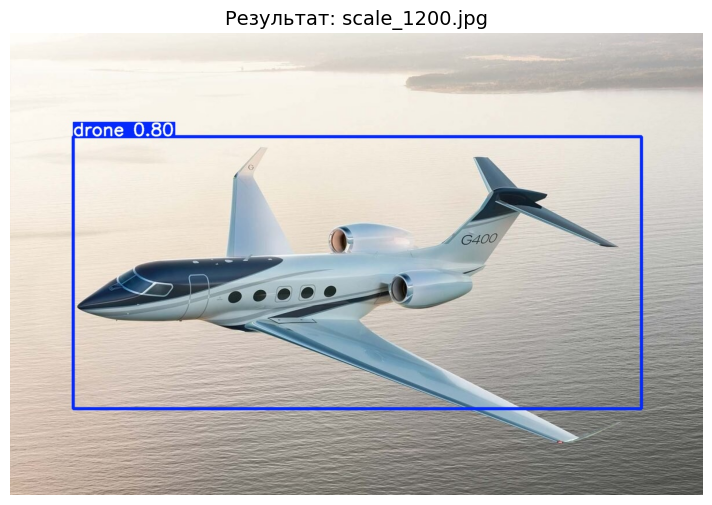

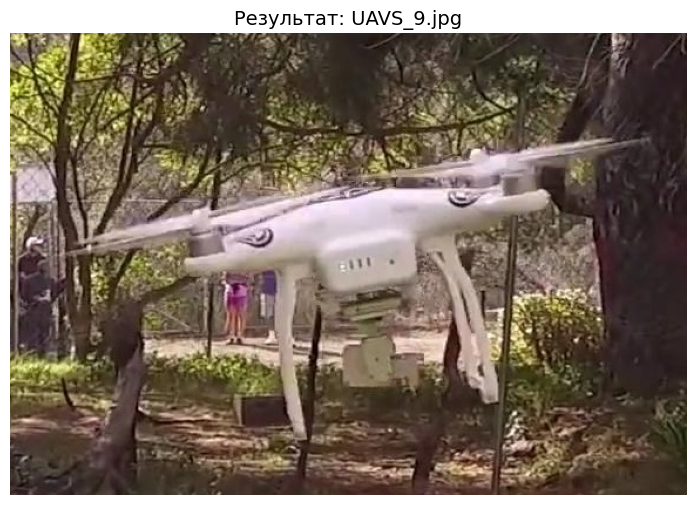

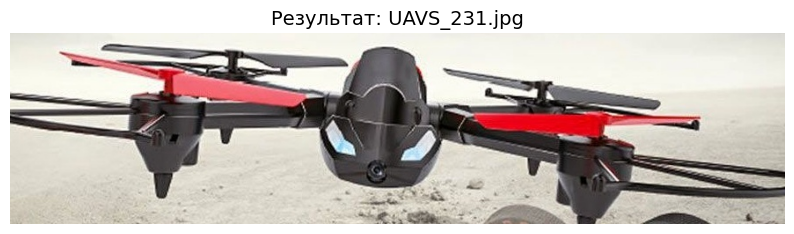

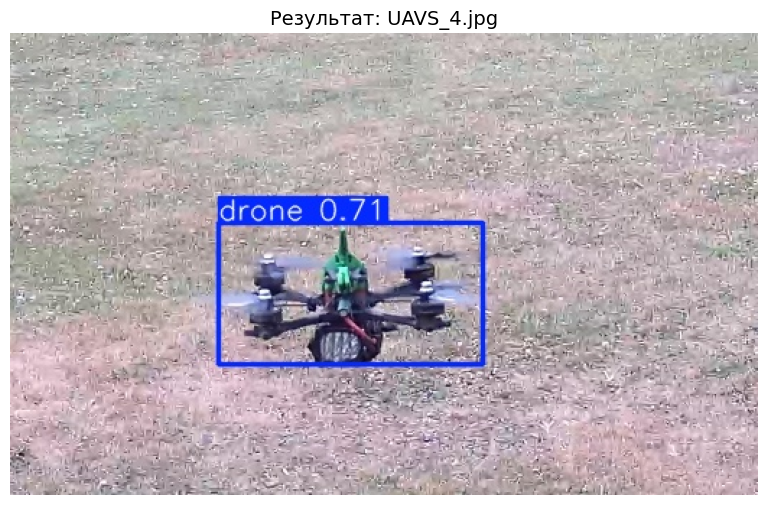

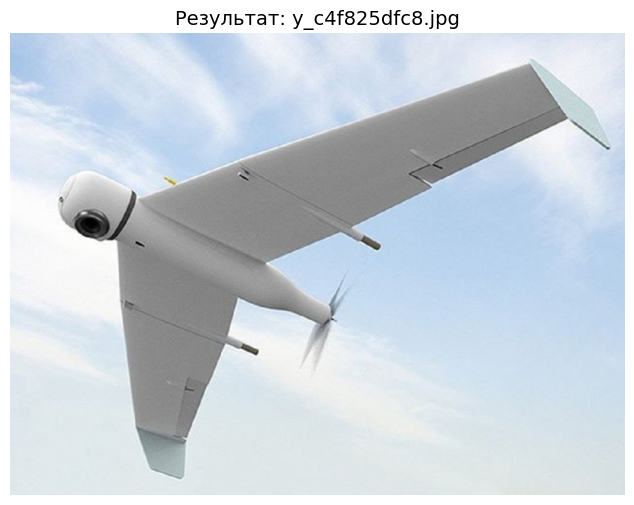

...

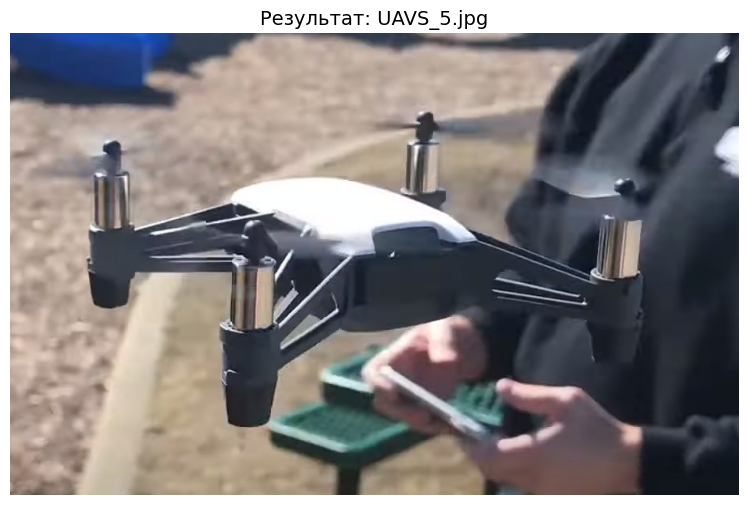

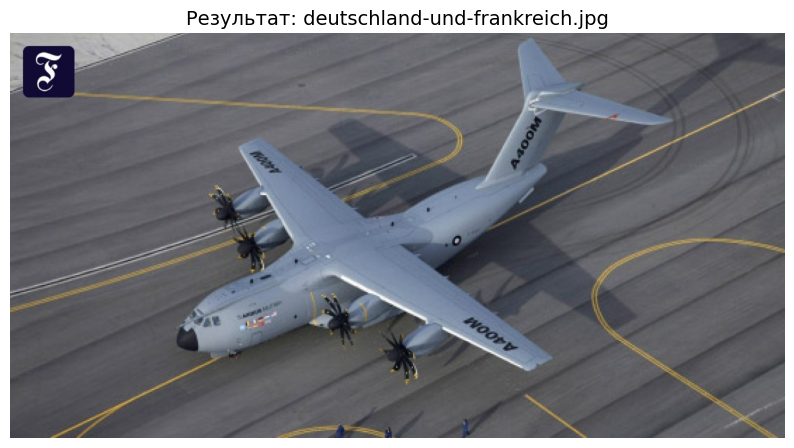

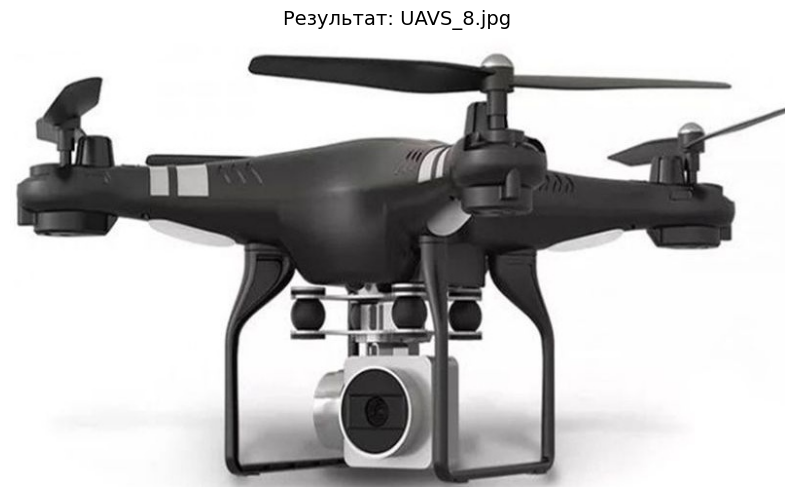

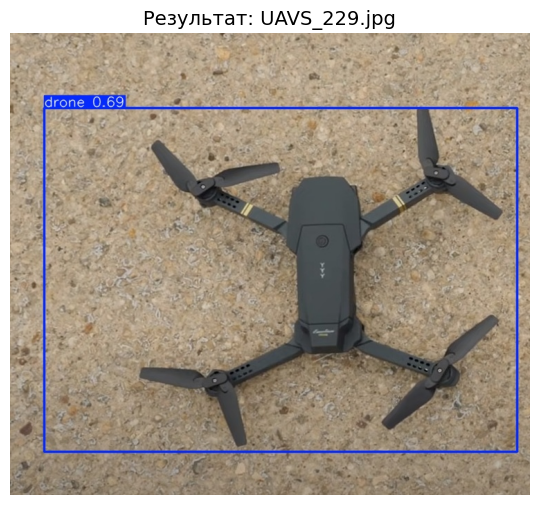

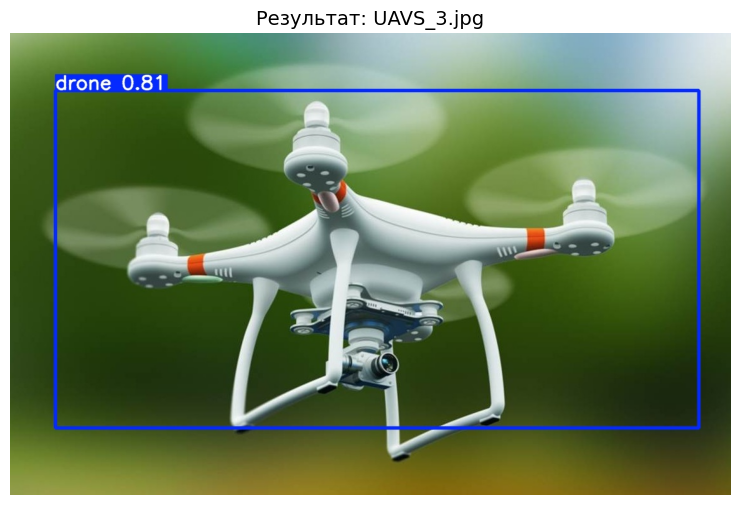

In [10]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import os

model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')  # или путь к last.pt

# Путь к папке с тестовыми изображениями
test_dir = '/kaggle/input/my-drone-test-v-trash'

# Прогоняем модель на папке
results = model.predict(source=test_dir, save=True, conf = 0.67 )

# Путь, где YOLO сохранит результаты
predict_dir = model.predictor.save_dir

# Выведем картинки с результатами
img_files = [f for f in os.listdir(predict_dir) if f.endswith(('.jpg', '.png'))]

for img_file in img_files:
    img_path = os.path.join(predict_dir, img_file)
    img = Image.open(img_path)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Результат: {img_file}", fontsize=14)
    plt.show()

In [11]:
with open("/kaggle/working/runs/detect/train/args.yaml",'r') as args:
    print(args.read())

task: detect
mode: train
model: yolov8s.pt
data: /kaggle/working/clean_dataset/data.yaml
epochs: 5
time: null
patience: 100
batch: 16
imgsz: 640
save: true
save_period: -1
cache: false
device: cuda:0
workers: 8
project: null
name: train
exist_ok: false
pretrained: true
optimizer: auto
verbose: true
seed: 0
deterministic: true
single_cls: false
rect: false
cos_lr: false
close_mosaic: 10
resume: false
amp: true
fraction: 1.0
profile: false
freeze: null
multi_scale: false
overlap_mask: true
mask_ratio: 4
dropout: 0.0
val: true
split: val
save_json: false
conf: null
iou: 0.7
max_det: 300
half: false
dnn: false
plots: true
source: null
vid_stride: 1
stream_buffer: false
visualize: false
augment: false
agnostic_nms: false
classes: null
retina_masks: false
embed: null
show: false
save_frames: false
save_txt: false
save_conf: false
save_crop: false
show_labels: true
show_conf: true
show_boxes: true
line_width: null
format: torchscript
keras: false
optimize: false
int8: false
dynamic: false
sim

In [12]:
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

model.train(epochs=10, lr0=0.001, close_mosaic=10, cos_lr=True)



Ultralytics 8.3.127 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/clean_dataset/data.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/kaggle/working/runs/detect/train/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10

train: Scanning /kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset/labels... 21668 images, 0 backgrounds, 1 corrupt: 100%|██████████| 21669/21669 [00:29<00:00, 722.84it/s]

train: /kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset/images/pic_722.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset/images/pic_722.jpg'


WARNING ⚠️ train: Cache directory /kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 151.0±171.3 MB/s, size: 206.8 KB)


val: Scanning /kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset/labels... 21668 images, 0 backgrounds, 1 corrupt: 100%|██████████| 21669/21669 [00:18<00:00, 1189.41it/s]

val: /kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset/images/pic_722.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset/images/pic_722.jpg'


WARNING ⚠️ val: Cache directory /kaggle/input/clean-dataset-uav-yolo/kaggle/working/clean_dataset is not writeable, cache not saved.


libpng warning: iCCP: known incorrect sRGB profile


Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train5
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      3.79G      1.096     0.6801      1.103         31        640:  35%|███▍      | 474/1355 [02:09<03:59,  3.68it/s]libpng warning: iCCP: known incorrect sRGB profile
       1/10      3.79G      1.106     0.6871      1.109         22        640:  45%|████▌     | 610/1355 [02:46<03:22,  3.68it/s]libpng warning: iCCP: known incorrect sRGB profile
       1/10      3.79G      1.107     0.6882       1.11         29        640:  48%|████▊     | 647/1355 [02:56<03:09,  3.73it/s]libpng warning: iCCP: known incorrect sRGB profile
       1/10       3.8G      1.143     0.7327      1.127          4        640: 100%|██████████| 1355/1355 [06:01<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:08<06:32,  1.66it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<03:21,  3.15it/s]li

                   all      21668      38474      0.903       0.84      0.913      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.88G       1.24     0.8441      1.183         27        640:  47%|████▋     | 635/1355 [02:47<03:14,  3.71it/s]libpng warning: iCCP: known incorrect sRGB profile
       2/10      5.88G      1.245     0.8504      1.182         29        640:  65%|██████▍   | 875/1355 [03:50<02:06,  3.79it/s]libpng warning: iCCP: known incorrect sRGB profile
       2/10      5.88G      1.256     0.8625      1.188         35        640:  99%|█████████▊| 1337/1355 [05:50<00:04,  3.76it/s]libpng warning: iCCP: known incorrect sRGB profile
       2/10      5.88G      1.255     0.8619      1.187          5        640: 100%|██████████| 1355/1355 [05:54<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:09<06:35,  1.64it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<02:57,  3.57it/s]l

                   all      21668      38474      0.868      0.801      0.881      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.88G      1.279      0.896      1.195         22        640:  28%|██▊       | 381/1355 [01:39<04:18,  3.77it/s]libpng warning: iCCP: known incorrect sRGB profile
       3/10      5.88G      1.276     0.8997      1.194         22        640:  38%|███▊      | 515/1355 [02:14<03:35,  3.90it/s]libpng warning: iCCP: known incorrect sRGB profile
       3/10      5.88G      1.275      0.901      1.196         22        640:  50%|████▉     | 672/1355 [02:55<02:59,  3.80it/s]libpng warning: iCCP: known incorrect sRGB profile
       3/10      5.88G      1.279     0.8924      1.198          8        640: 100%|██████████| 1355/1355 [05:51<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:08<06:27,  1.68it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<02:57,  3.58it/s]li

                   all      21668      38474      0.906      0.823      0.901      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.88G      1.244     0.8466      1.182         25        640:  63%|██████▎   | 858/1355 [03:41<02:07,  3.90it/s]libpng warning: iCCP: known incorrect sRGB profile
       4/10      5.88G      1.241     0.8445       1.18         25        640:  74%|███████▍  | 1004/1355 [04:19<01:30,  3.87it/s]libpng warning: iCCP: known incorrect sRGB profile
       4/10      5.88G      1.237     0.8373      1.178         23        640:  99%|█████████▊| 1337/1355 [05:45<00:04,  3.89it/s]libpng warning: iCCP: known incorrect sRGB profile
       4/10      5.88G      1.237     0.8368      1.178          4        640: 100%|██████████| 1355/1355 [05:50<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 29/678 [00:09<05:28,  1.98it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<02:54,  3.64it/s]

                   all      21668      38474      0.921      0.842      0.921      0.613

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.88G      1.202     0.7884      1.168         30        640:   5%|▍         | 65/1355 [00:16<05:34,  3.85it/s]libpng warning: iCCP: known incorrect sRGB profile
       5/10      5.88G      1.188     0.7764       1.15         21        640:  24%|██▎       | 321/1355 [01:23<04:27,  3.87it/s]libpng warning: iCCP: known incorrect sRGB profile
       5/10      5.88G      1.184     0.7746      1.148         33        640:  78%|███████▊  | 1059/1355 [04:34<01:16,  3.89it/s]libpng warning: iCCP: known incorrect sRGB profile
       5/10      5.88G      1.183     0.7704      1.147          5        640: 100%|██████████| 1355/1355 [05:50<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:08<06:34,  1.65it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<02:51,  3.71it/s]li

                   all      21668      38474       0.92      0.856      0.927       0.63

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.88G      1.163     0.7291      1.137         22        640:  21%|██        | 287/1355 [01:14<04:33,  3.90it/s]libpng warning: iCCP: known incorrect sRGB profile
       6/10      5.88G      1.148     0.7232      1.126         26        640:  47%|████▋     | 635/1355 [02:44<03:04,  3.89it/s]libpng warning: iCCP: known incorrect sRGB profile
       6/10      5.88G      1.146     0.7214      1.124         29        640:  49%|████▊     | 660/1355 [02:50<02:57,  3.92it/s]libpng warning: iCCP: known incorrect sRGB profile
       6/10      5.88G      1.134     0.7128       1.12          7        640: 100%|██████████| 1355/1355 [05:50<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:08<06:40,  1.62it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<02:50,  3.73it/s]li

                   all      21668      38474      0.923      0.869      0.938      0.651

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.88G      1.083     0.6665      1.107         29        640:   2%|▏         | 28/1355 [00:07<05:41,  3.89it/s]libpng warning: iCCP: known incorrect sRGB profile
       7/10      5.88G      1.079     0.6638      1.101         27        640:  27%|██▋       | 368/1355 [01:35<04:19,  3.80it/s]libpng warning: iCCP: known incorrect sRGB profile
       7/10      5.88G      1.073     0.6561      1.093         27        640:  91%|█████████▏| 1238/1355 [05:20<00:31,  3.76it/s]libpng warning: iCCP: known incorrect sRGB profile
       7/10      5.88G      1.074     0.6554      1.093          9        640: 100%|██████████| 1355/1355 [05:50<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:09<06:55,  1.57it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<02:54,  3.65it/s]li

                   all      21668      38474      0.944      0.889      0.952      0.675

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.88G      1.039     0.6131      1.078         29        640:  23%|██▎       | 314/1355 [01:21<04:25,  3.92it/s]libpng warning: iCCP: known incorrect sRGB profile
       8/10      5.88G      1.038     0.6114      1.076         27        640:  42%|████▏     | 575/1355 [02:29<03:26,  3.78it/s]libpng warning: iCCP: known incorrect sRGB profile
       8/10      5.88G      1.038     0.6139      1.077         20        640:  47%|████▋     | 633/1355 [02:44<03:06,  3.88it/s]libpng warning: iCCP: known incorrect sRGB profile
       8/10      5.88G      1.033     0.6068      1.071          4        640: 100%|██████████| 1355/1355 [05:51<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:09<06:58,  1.55it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:13<03:00,  3.52it/s]li

                   all      21668      38474      0.947      0.903      0.959      0.695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.88G     0.9962      0.585      1.052         34        640:  11%|█         | 151/1355 [00:39<05:06,  3.93it/s]libpng warning: iCCP: known incorrect sRGB profile
       9/10      5.88G      1.003     0.5799      1.056         21        640:  28%|██▊       | 373/1355 [01:36<04:14,  3.85it/s]libpng warning: iCCP: known incorrect sRGB profile
       9/10      5.88G     0.9905     0.5689      1.047         25        640:  83%|████████▎ | 1130/1355 [04:53<00:57,  3.88it/s]libpng warning: iCCP: known incorrect sRGB profile
       9/10      5.88G       0.99     0.5684      1.049          6        640: 100%|██████████| 1355/1355 [05:51<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 29/678 [00:09<04:59,  2.16it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<03:17,  3.22it/s]l

                   all      21668      38474      0.951      0.916      0.964      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.88G     0.9703     0.5637      1.043         20        640:   4%|▍         | 51/1355 [00:13<05:39,  3.84it/s]libpng warning: iCCP: known incorrect sRGB profile
      10/10      5.88G     0.9703     0.5567      1.036         28        640:  28%|██▊       | 374/1355 [01:36<04:15,  3.85it/s]libpng warning: iCCP: known incorrect sRGB profile
      10/10      5.88G     0.9716     0.5535      1.035         25        640:  41%|████      | 557/1355 [02:24<03:28,  3.83it/s]libpng warning: iCCP: known incorrect sRGB profile
      10/10      5.88G     0.9668     0.5489      1.036          9        640: 100%|██████████| 1355/1355 [05:50<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:08<06:41,  1.62it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:12<02:59,  3.54it/s]lib

                   all      21668      38474      0.954      0.918      0.965      0.715

10 epochs completed in 1.495 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 22.5MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 28/678 [00:09<06:24,  1.69it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 42/678 [00:13<03:00,  3.53it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  99%|█████████▉| 674/678 [03:07<00:01,  3.59it/s]libpng warning: iCCP: known incorrect sRGB profile
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 678/678 [03:08<00:00,  3.59it/s]


                   all      21668      38474      0.953      0.919      0.965      0.715


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 4.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79208d82c250>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 


image 1/23 /kaggle/input/my-drone-test-v-trash/293185-alexfas01.jpg: 384x640 (no detections), 11.5ms
image 2/23 /kaggle/input/my-drone-test-v-trash/44ed1041673116d5ab7f721a97a79c7b.jpg: 480x640 (no detections), 13.9ms
image 3/23 /kaggle/input/my-drone-test-v-trash/UAVS_10.jpg: 480x640 1 drone, 13.1ms
image 4/23 /kaggle/input/my-drone-test-v-trash/UAVS_11.jpg: 320x640 1 drone, 11.1ms
image 5/23 /kaggle/input/my-drone-test-v-trash/UAVS_12.jpg: 448x640 1 drone, 13.6ms
image 6/23 /kaggle/input/my-drone-test-v-trash/UAVS_13.jpg: 352x640 1 drone, 11.2ms
image 7/23 /kaggle/input/my-drone-test-v-trash/UAVS_2.jpg: 224x640 1 drone, 9.1ms
image 8/23 /kaggle/input/my-drone-test-v-trash/UAVS_228.jpg: 640x640 1 drone, 17.0ms
image 9/23 /kaggle/input/my-drone-test-v-trash/UAVS_229.jpg: 576x640 1 drone, 16.5ms
image 10/23 /kaggle/input/my-drone-test-v-trash/UAVS_230.jpg: 352x640 1 drone, 11.4ms
image 11/23 /kaggle/input/my-drone-test-v-trash/UAVS_231.jpg: 160x640 (no detections), 8.6ms
image 12/23 /k

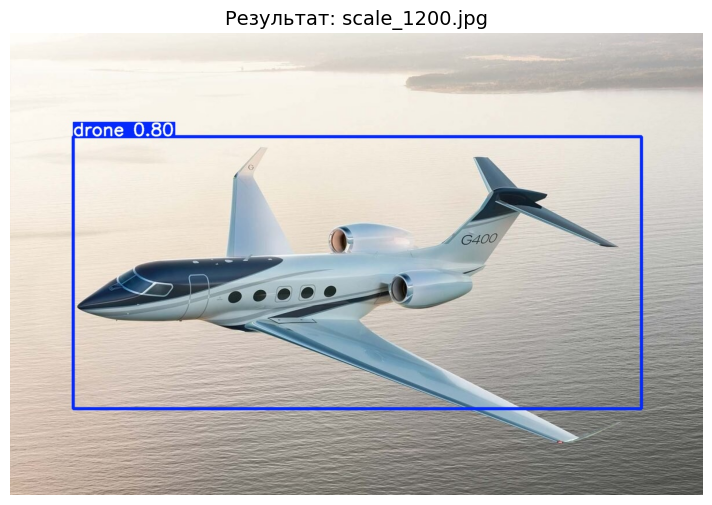

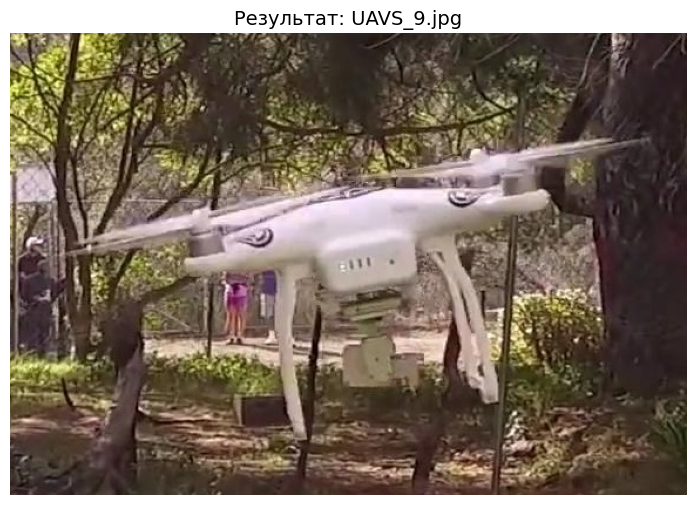

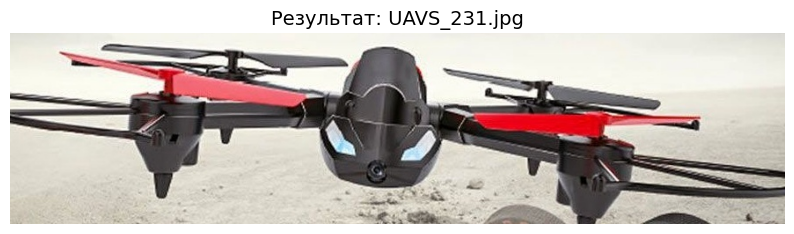

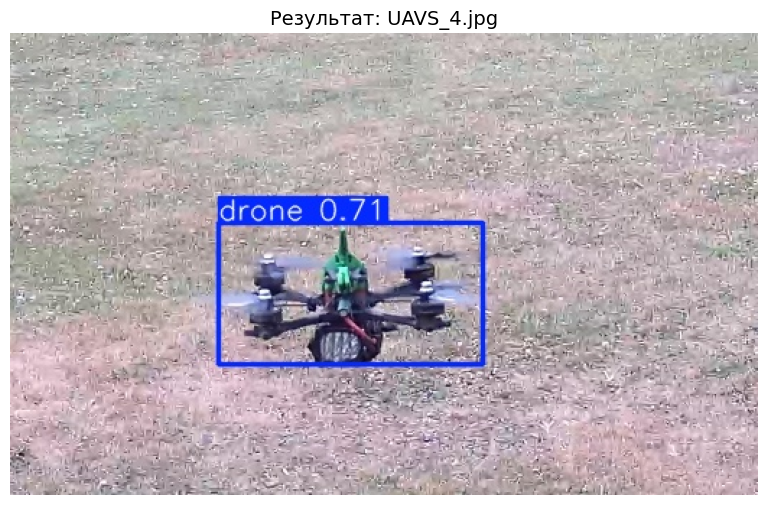

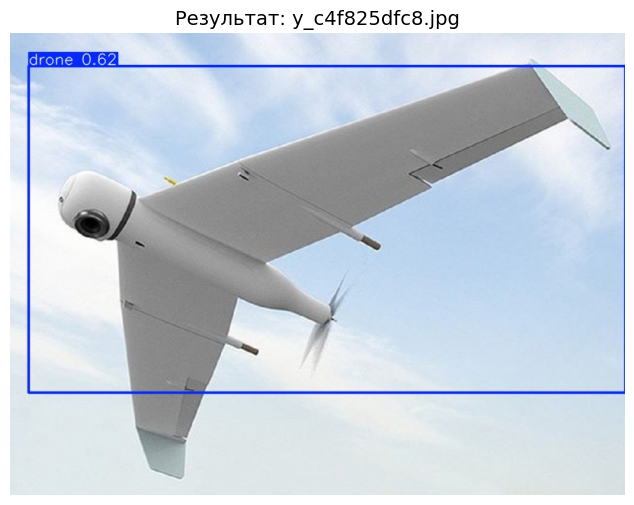

...

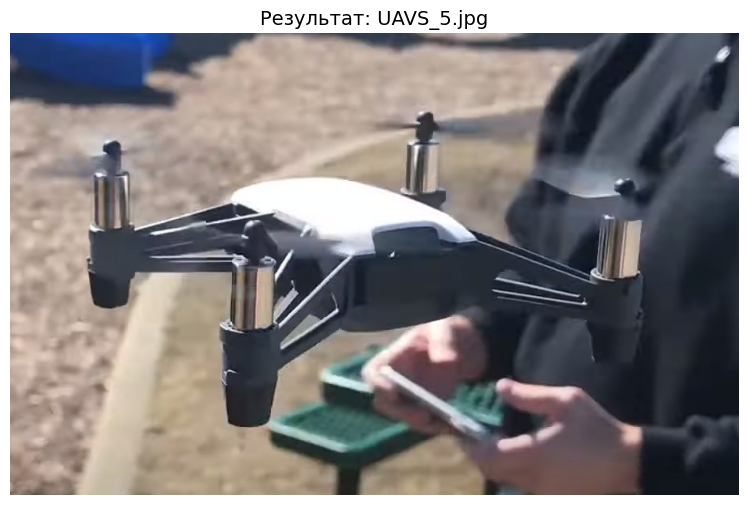

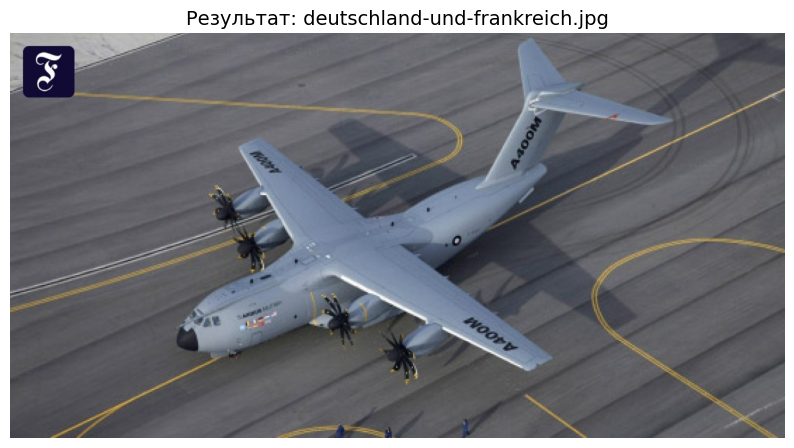

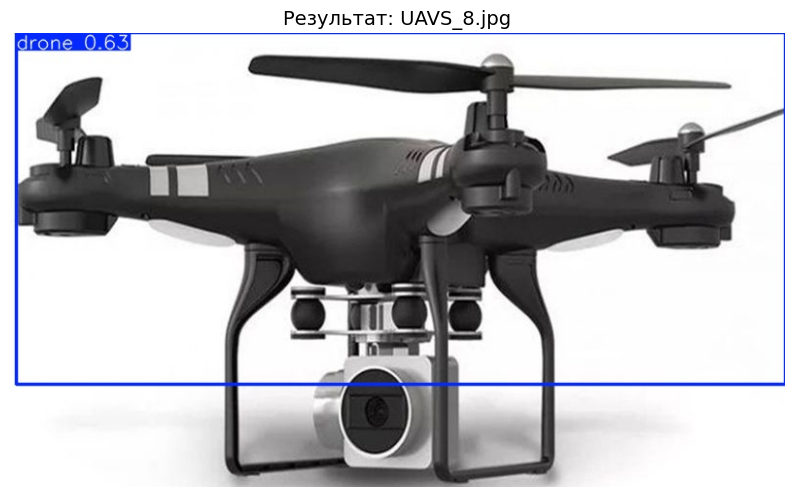

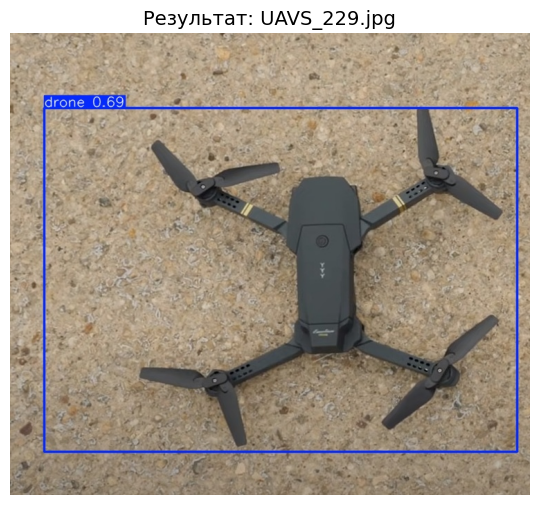

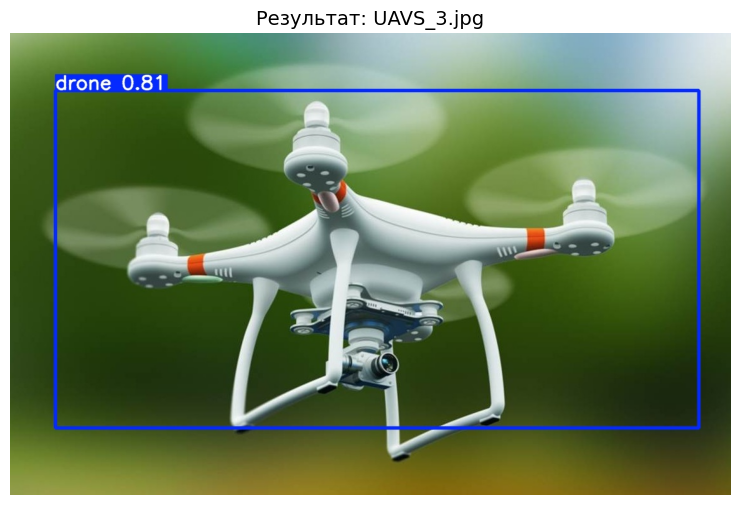

In [15]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import os

model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')  # или путь к last.pt

# Путь к папке с тестовыми изображениями
test_dir = '/kaggle/input/my-drone-test-v-trash'

# Прогоняем модель на папке
results = model.predict(source=test_dir, save=True, conf = 0.6)

# Путь, где YOLO сохранит результаты
predict_dir = model.predictor.save_dir

# Выведем картинки с результатами
img_files = [f for f in os.listdir(predict_dir) if f.endswith(('.jpg', '.png'))]

for img_file in img_files:
    img_path = os.path.join(predict_dir, img_file)
    img = Image.open(img_path)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Результат: {img_file}", fontsize=14)
    plt.show()